# Notebook 05: Evaluation Report — `sobelv5` (Local / VSCode)

### English
This notebook evaluates the trained `sobelv5` Generator using the architecture and conventions defined in Notebook 04.

It is designed for a local VSCode/Jupyter environment. Model files are expected under a local `model/` directory. The notebook automatically searches common layouts such as:

- `./model/stage1`, `./model/stage2`, `./model/stage3`
- `./model/sobelv5/stage1`, ...
- `./models/sobelv5/stage1`, ...

The preferred checkpoint is:

`stage3/best/generator_best.weights.h5`

If validation images are available locally, the notebook also evaluates the Generator against real images.

### Tiếng Việt
Notebook này đánh giá Generator đã train của `sobelv5` theo đúng kiến trúc và quy ước trong Notebook 04.

Notebook được thiết kế để chạy local bằng VSCode/Jupyter. Các file model được giả định nằm trong thư mục `model/`. Notebook tự tìm một số cấu trúc phổ biến như:

- `./model/stage1`, `./model/stage2`, `./model/stage3`
- `./model/sobelv5/stage1`, ...
- `./models/sobelv5/stage1`, ...

Checkpoint được ưu tiên là:

`stage3/best/generator_best.weights.h5`

Nếu validation images có sẵn trên máy, notebook sẽ đánh giá Generator so với ảnh thật.

## 1. Environment

### English
The evaluation only requires TensorFlow/Keras, NumPy, Pandas, Matplotlib, Pillow, and SciPy for optional FID computation.

GPU is useful for Inception-based metrics but is not required for the basic evaluation.

### Tiếng Việt
Phần đánh giá cơ bản cần TensorFlow/Keras, NumPy, Pandas, Matplotlib, Pillow. SciPy được dùng cho FID tùy chọn.

GPU giúp chạy metric dựa trên Inception nhanh hơn nhưng không bắt buộc cho phần đánh giá cơ bản.

In [1]:
from pathlib import Path
import json
import math
import re
import random
import warnings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image as PILImage

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, Model

print("TensorFlow:", tf.__version__)
print("Keras:", keras.__version__)
print("GPU:", tf.config.list_physical_devices("GPU"))

RANDOM_SEED = 42
random.seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)

TensorFlow: 2.20.0
Keras: 3.11.3
GPU: []


## 2. Local Paths

### English
`MODEL_ROOT_OVERRIDE` can be set manually if automatic discovery does not match the local project layout.

The evaluation output is written to `evaluation/sobelv5/` under the current project directory.

### Tiếng Việt
Có thể đặt `MODEL_ROOT_OVERRIDE` thủ công nếu auto-discovery không đúng với cấu trúc project local.

Kết quả đánh giá được lưu vào `evaluation/sobelv5/` trong project hiện tại.

In [2]:
CWD = Path.cwd().resolve()

# Optional manual overrides.
MODEL_ROOT_OVERRIDE = None
DATA_ROOT_OVERRIDE = None
OUTPUT_ROOT_OVERRIDE = None


def looks_like_model_root(path):
    path = Path(path)
    return any((path / stage).exists() for stage in ("stage1", "stage2", "stage3"))


def candidate_project_roots(start):
    roots = [start]
    roots.extend(list(start.parents)[:4])
    return roots


def discover_model_root():
    if MODEL_ROOT_OVERRIDE is not None:
        path = Path(MODEL_ROOT_OVERRIDE).expanduser().resolve()
        if not looks_like_model_root(path):
            raise FileNotFoundError(f"MODEL_ROOT_OVERRIDE does not look like a sobelv5 model folder: {path}")
        return path

    candidates = []
    for base in candidate_project_roots(CWD):
        for relative in (
            Path("model"),
            Path("model") / "sobelv5",
            Path("models") / "sobelv5",
        ):
            path = (base / relative).resolve()
            if path.exists() and looks_like_model_root(path):
                candidates.append(path)

    if not candidates:
        raise FileNotFoundError(
            "Could not find the local sobelv5 model folder.\n"
            "Expected stage1/stage2/stage3 under ./model, ./model/sobelv5, or ./models/sobelv5.\n"
            "Set MODEL_ROOT_OVERRIDE manually if your folder is elsewhere."
        )

    candidates = sorted(set(candidates), key=lambda p: (len(p.parts), str(p)))
    if len(candidates) > 1:
        print("Multiple model roots found:")
        for i, path in enumerate(candidates):
            print(f"  [{i}] {path}")
        print("Using:", candidates[0])

    return candidates[0]


MODEL_ROOT = discover_model_root()
PROJECT_ROOT = MODEL_ROOT.parent if MODEL_ROOT.name == "sobelv5" else MODEL_ROOT.parent

if OUTPUT_ROOT_OVERRIDE is None:
    OUTPUT_DIR = (CWD / "evaluation" / "sobelv5").resolve()
else:
    OUTPUT_DIR = Path(OUTPUT_ROOT_OVERRIDE).expanduser().resolve()

FIGURE_DIR = OUTPUT_DIR / "figures"
TABLE_DIR = OUTPUT_DIR / "tables"
GENERATED_DIR = OUTPUT_DIR / "generated"

for folder in (OUTPUT_DIR, FIGURE_DIR, TABLE_DIR, GENERATED_DIR):
    folder.mkdir(parents=True, exist_ok=True)

print("Working directory :", CWD)
print("Model root        :", MODEL_ROOT)
print("Evaluation output :", OUTPUT_DIR)

Working directory : D:\Images by GAN\dog-gan-project\notebooks
Model root        : D:\Images by GAN\dog-gan-project\models\sobelv5
Evaluation output : D:\Images by GAN\dog-gan-project\notebooks\evaluation\sobelv5


## 3. `sobelv5` Configuration

### English
The evaluation reconstructs the Generator exactly as used during training:

- image size: `128×128`
- latent size: `100`
- classes: dog = `0`, cat = `1`
- class embedding: `50`
- initial feature map: `8×8×256`
- transposed convolutions: `128 → 64 → 32 → RGB`
- output activation: `tanh`

Only Generator weights are required for the core evaluation.

### Tiếng Việt
Notebook dựng lại Generator đúng theo cấu hình training:

- kích thước ảnh: `128×128`
- latent size: `100`
- class: dog = `0`, cat = `1`
- class embedding: `50`
- feature map ban đầu: `8×8×256`
- transposed convolution: `128 → 64 → 32 → RGB`
- activation output: `tanh`

Phần đánh giá chính chỉ cần Generator weights.

In [3]:
IMAGE_SIZE = 128
NOISE_DIM = 100
EMBEDDING_DIM = 50

SPECIES_TO_LABEL = {"dog": 0, "cat": 1}
LABEL_TO_SPECIES = {v: k for k, v in SPECIES_TO_LABEL.items()}
NUM_CLASSES = len(SPECIES_TO_LABEL)

EVAL_SAMPLES_PER_CLASS = 64
GRID_SAMPLES_PER_CLASS = 16
GENERATION_BATCH_SIZE = 64

# Optional Inception evaluation.
RUN_INCEPTION_METRICS = False
FID_SAMPLES_PER_CLASS = 1000
KID_SUBSET_SIZE = 100
KID_SUBSETS = 50

## 4. Generator Architecture

### English
This definition must match the training notebook because `.weights.h5` files store weights, not the architecture.

### Tiếng Việt
Định nghĩa này phải khớp với notebook training vì file `.weights.h5` chỉ chứa trọng số, không chứa kiến trúc model.

In [4]:
def build_generator(
    noise_dim=NOISE_DIM,
    num_classes=NUM_CLASSES,
    embedding_dim=EMBEDDING_DIM,
    name="generator",
):
    noise_input = layers.Input(shape=(noise_dim,), name="noise")
    label_input = layers.Input(shape=(), dtype="int32", name="label")

    label_embed = layers.Embedding(num_classes, embedding_dim)(label_input)
    x = layers.Concatenate()([noise_input, label_embed])

    x = layers.Dense(8 * 8 * 256, use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(negative_slope=0.2)(x)
    x = layers.Reshape((8, 8, 256))(x)

    x = layers.Conv2DTranspose(
        128, 4, strides=2, padding="same", use_bias=False
    )(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(negative_slope=0.2)(x)

    x = layers.Conv2DTranspose(
        64, 4, strides=2, padding="same", use_bias=False
    )(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(negative_slope=0.2)(x)

    x = layers.Conv2DTranspose(
        32, 4, strides=2, padding="same", use_bias=False
    )(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(negative_slope=0.2)(x)

    output = layers.Conv2DTranspose(
        3,
        4,
        strides=2,
        padding="same",
        activation="tanh",
    )(x)

    return Model([noise_input, label_input], output, name=name)


generator_test = build_generator()
print("Generator output shape:", generator_test.output_shape)
print("Generator parameters:", f"{generator_test.count_params():,}")
del generator_test

Generator output shape: (None, 128, 128, 3)
Generator parameters: 3,213,799


## 5. Checkpoint Inventory

### English
The notebook scans all Generator checkpoints under the local model folder.

Priority for automatic selection:

1. Stage 3 best
2. Stage 3 EMA rolling checkpoint
3. Stage 3 rolling Generator
4. Stage 2 best
5. Stage 2 EMA
6. Stage 2 Generator
7. Stage 1 best
8. Stage 1 Generator

The selected path can be overridden manually.

### Tiếng Việt
Notebook quét tất cả Generator checkpoint trong thư mục model local.

Thứ tự ưu tiên tự động:

1. Stage 3 best
2. Stage 3 EMA rolling checkpoint
3. Stage 3 rolling Generator
4. Stage 2 best
5. Stage 2 EMA
6. Stage 2 Generator
7. Stage 1 best
8. Stage 1 Generator

Có thể chỉ định checkpoint thủ công nếu cần.

In [5]:
SELECTED_CHECKPOINT_OVERRIDE = None


def checkpoint_inventory(model_root):
    records = []

    for stage_idx, stage in enumerate(("stage1", "stage2", "stage3"), start=1):
        stage_dir = model_root / stage
        if not stage_dir.exists():
            continue

        candidates = []

        best = stage_dir / "best" / "generator_best.weights.h5"
        if best.exists():
            candidates.append((best, "best", None))

        rolling_ema = stage_dir / "generator_ema.weights.h5"
        if rolling_ema.exists():
            candidates.append((rolling_ema, "rolling_ema", None))

        rolling = stage_dir / "generator.weights.h5"
        if rolling.exists():
            candidates.append((rolling, "rolling", None))

        snap_dir = stage_dir / "snapshots"
        if snap_dir.exists():
            for path in sorted(snap_dir.glob("generator_ema_e*.weights.h5")):
                match = re.search(r"_e(\d+)", path.name)
                epoch = int(match.group(1)) if match else None
                candidates.append((path, "snapshot_ema", epoch))

            for path in sorted(snap_dir.glob("generator_e*.weights.h5")):
                match = re.search(r"_e(\d+)", path.name)
                epoch = int(match.group(1)) if match else None
                candidates.append((path, "snapshot", epoch))

        for path, kind, epoch in candidates:
            records.append({
                "stage": stage,
                "stage_index": stage_idx,
                "kind": kind,
                "epoch": epoch,
                "path": str(path.resolve()),
                "size_mb": path.stat().st_size / (1024 ** 2),
            })

    return pd.DataFrame(records)


inventory = checkpoint_inventory(MODEL_ROOT)

if inventory.empty:
    raise FileNotFoundError(f"No Generator .weights.h5 checkpoints found under {MODEL_ROOT}")

display(inventory.sort_values(["stage_index", "kind", "epoch"], na_position="last"))
inventory.to_csv(TABLE_DIR / "checkpoint_inventory.csv", index=False)


def choose_checkpoint():
    if SELECTED_CHECKPOINT_OVERRIDE is not None:
        path = Path(SELECTED_CHECKPOINT_OVERRIDE).expanduser().resolve()
        if not path.exists():
            raise FileNotFoundError(path)
        return path

    priority = [
        ("stage3", "best"),
        ("stage3", "rolling_ema"),
        ("stage3", "rolling"),
        ("stage2", "best"),
        ("stage2", "rolling_ema"),
        ("stage2", "rolling"),
        ("stage1", "best"),
        ("stage1", "rolling"),
    ]

    for stage, kind in priority:
        rows = inventory[(inventory["stage"] == stage) & (inventory["kind"] == kind)]
        if not rows.empty:
            return Path(rows.iloc[0]["path"])

    row = inventory.sort_values(["stage_index", "epoch"], ascending=[False, False]).iloc[0]
    return Path(row["path"])


SELECTED_CHECKPOINT = choose_checkpoint()
print("Selected checkpoint:")
print(SELECTED_CHECKPOINT)

,stage,stage_index,kind,epoch,path,size_mb
0,stage1,1,best,NaN,D:\Images by GAN\dog-gan-project\models\sobelv...,12.308365
1,stage1,1,rolling,NaN,D:\Images by GAN\dog-gan-project\models\sobelv...,12.308365
2,stage1,1,snapshot,25.0,D:\Images by GAN\dog-gan-project\models\sobelv...,12.308365
3,stage1,1,snapshot,50.0,D:\Images by GAN\dog-gan-project\models\sobelv...,12.308365
4,stage1,1,snapshot,75.0,D:\Images by GAN\dog-gan-project\models\sobelv...,12.308365
...,...,...,...,...,...,...
43,stage3,3,snapshot_ema,60.0,D:\Images by GAN\dog-gan-project\models\sobelv...,12.308365
44,stage3,3,snapshot_ema,70.0,D:\Images by GAN\dog-gan-project\models\sobelv...,12.308365
45,stage3,3,snapshot_ema,80.0,D:\Images by GAN\dog-gan-project\models\sobelv...,12.308365
46,stage3,3,snapshot_ema,90.0,D:\Images by GAN\dog-gan-project\models\sobelv...,12.308365


Selected checkpoint:
D:\Images by GAN\dog-gan-project\models\sobelv5\stage3\best\generator_best.weights.h5


## 6. Load the Selected Generator

### English
A small test batch is generated immediately after loading. If the architecture or weight file is incompatible, this cell fails early.

### Tiếng Việt
Ngay sau khi load weights, notebook sinh một batch nhỏ để kiểm tra. Nếu kiến trúc hoặc file weight không tương thích, cell này sẽ báo lỗi sớm.

In [6]:
generator = build_generator()
generator.load_weights(SELECTED_CHECKPOINT)

test_noise = tf.random.normal([4, NOISE_DIM], seed=RANDOM_SEED)
test_labels = tf.constant([0, 0, 1, 1], dtype=tf.int32)
test_output = generator([test_noise, test_labels], training=False)

print("Loaded:", SELECTED_CHECKPOINT.name)
print("Output:", test_output.shape)
print(
    "Range:",
    float(tf.reduce_min(test_output)),
    "to",
    float(tf.reduce_max(test_output)),
)

Loaded: generator_best.weights.h5
Output: (4, 128, 128, 3)
Range: -0.9843156337738037 to 0.975255012512207


## 7. Training History Review

### English
If `history.csv` files were copied with the model folder, the notebook combines all available stages and summarizes the training trajectory.

### Tiếng Việt
Nếu thư mục model có các file `history.csv`, notebook ghép các stage hiện có và tóm tắt quá trình training.

In [7]:
history_frames = []
global_offset = 0

for stage in ("stage1", "stage2", "stage3"):
    history_path = MODEL_ROOT / stage / "history.csv"
    if not history_path.exists():
        continue

    frame = pd.read_csv(history_path)
    if frame.empty:
        continue

    frame = frame.copy()
    frame["global_epoch"] = frame["epoch"] + global_offset
    global_offset = int(frame["global_epoch"].max())
    history_frames.append(frame)

if history_frames:
    all_history = pd.concat(history_frames, ignore_index=True)
    all_history.to_csv(TABLE_DIR / "all_training_history.csv", index=False)

    stage_summary = (
        all_history.groupby("stage")
        .agg(
            epochs=("epoch", "max"),
            gen_loss_last=("gen_loss", "last"),
            disc_loss_last=("disc_loss", "last"),
            disc_acc_last=("disc_acc", "last"),
            score_best=("score", "max"),
            health_last=("health", "last"),
            sharp_ratio_last=("sharp_ratio", "last"),
        )
        .reset_index()
    )
    display(stage_summary)
    stage_summary.to_csv(TABLE_DIR / "stage_history_summary.csv", index=False)
else:
    all_history = None
    print("No history.csv files found. Checkpoint evaluation can still continue.")

,stage,epochs,gen_loss_last,disc_loss_last,disc_acc_last,score_best,health_last,sharp_ratio_last
0,stage1,150,3.385183,0.490871,0.972758,1.000000,0.894077,0.926752
1,stage2,200,1.656147,0.849593,0.859679,0.993093,0.937317,0.993093
2,stage3,100,2.014627,0.685072,0.925731,1.000000,0.938176,1.027827


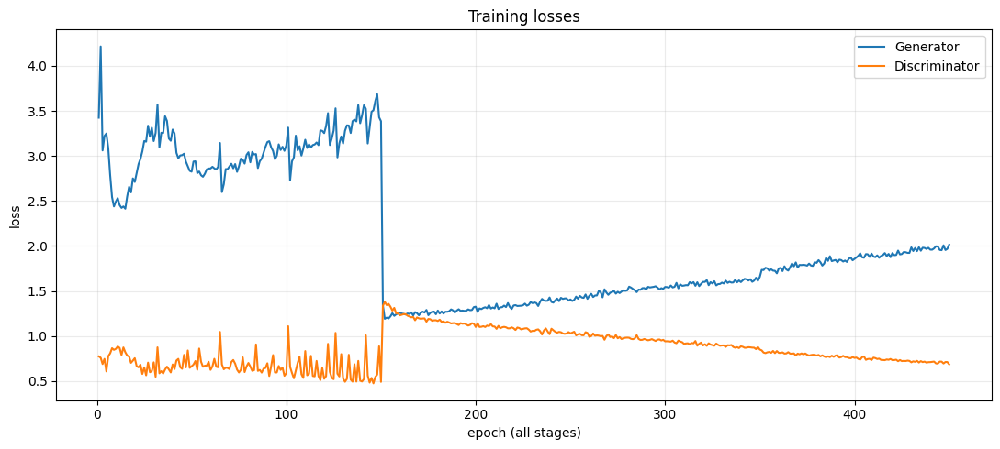

In [8]:
if all_history is not None:
    plt.figure(figsize=(11, 5))
    plt.plot(all_history["global_epoch"], all_history["gen_loss"], label="Generator")
    plt.plot(all_history["global_epoch"], all_history["disc_loss"], label="Discriminator")
    plt.xlabel("epoch (all stages)")
    plt.ylabel("loss")
    plt.title("Training losses")
    plt.grid(alpha=0.25)
    plt.legend()
    plt.tight_layout()
    plt.savefig(FIGURE_DIR / "01_losses.png", dpi=150)
    plt.show()

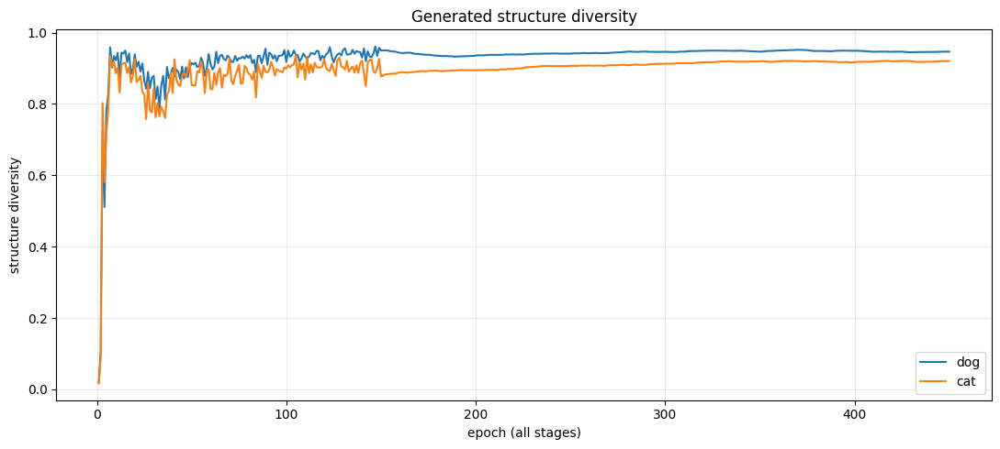

In [9]:
if all_history is not None and {"struct_dog", "struct_cat"}.issubset(all_history.columns):
    plt.figure(figsize=(11, 5))
    plt.plot(all_history["global_epoch"], all_history["struct_dog"], label="dog")
    plt.plot(all_history["global_epoch"], all_history["struct_cat"], label="cat")
    plt.xlabel("epoch (all stages)")
    plt.ylabel("structure diversity")
    plt.title("Generated structure diversity")
    plt.grid(alpha=0.25)
    plt.legend()
    plt.tight_layout()
    plt.savefig(FIGURE_DIR / "02_structure_diversity.png", dpi=150)
    plt.show()

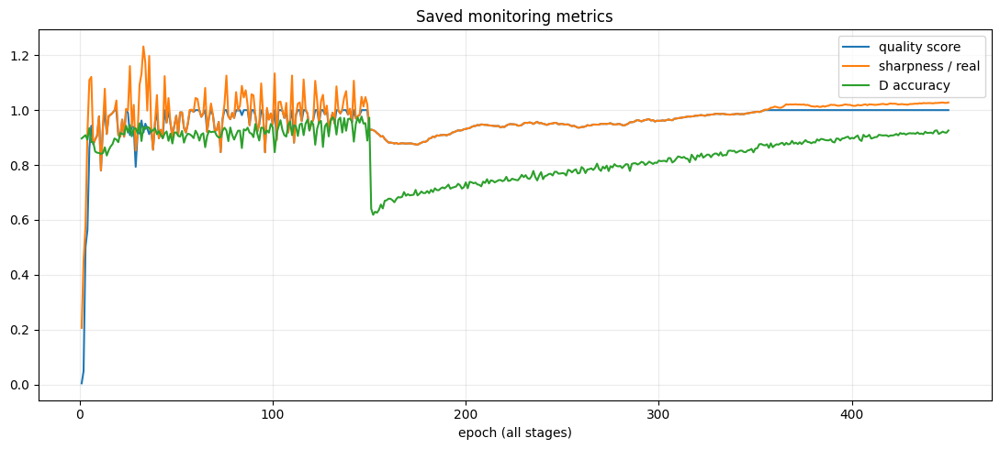

In [10]:
if all_history is not None:
    plt.figure(figsize=(11, 5))
    if "score" in all_history:
        plt.plot(all_history["global_epoch"], all_history["score"], label="quality score")
    if "sharp_ratio" in all_history:
        plt.plot(all_history["global_epoch"], all_history["sharp_ratio"], label="sharpness / real")
    if "disc_acc" in all_history:
        plt.plot(all_history["global_epoch"], all_history["disc_acc"], label="D accuracy")
    plt.xlabel("epoch (all stages)")
    plt.title("Saved monitoring metrics")
    plt.grid(alpha=0.25)
    plt.legend()
    plt.tight_layout()
    plt.savefig(FIGURE_DIR / "03_saved_metrics.png", dpi=150)
    plt.show()

## 8. Best-Checkpoint Metadata

### English
`best_info.json` is read from every available stage. These are the scores that were used during training to select the saved best Generator.

### Tiếng Việt
Notebook đọc `best_info.json` của từng stage. Đây là các score đã được dùng trong quá trình training để chọn best Generator.

In [11]:
best_rows = []

for stage in ("stage1", "stage2", "stage3"):
    info_path = MODEL_ROOT / stage / "best" / "best_info.json"
    if not info_path.exists():
        continue

    try:
        info = json.loads(info_path.read_text(encoding="utf-8"))
    except Exception as exc:
        print(f"Could not read {info_path}: {exc}")
        continue

    row = {"stage": stage}
    row.update(info)
    best_rows.append(row)

if best_rows:
    best_table = pd.DataFrame(best_rows)
    display(best_table)
    best_table.to_csv(TABLE_DIR / "best_checkpoint_info.csv", index=False)
else:
    best_table = None
    print("No best_info.json files found.")

,stage,epoch,score,health,struct_dog,color_dog,sharp_dog,struct_cat,color_cat,sharp_cat
0,stage1,60,1.0000,0.8589,0.9127,0.1978,0.3324,0.8426,0.1856,0.3534
1,stage2,200,0.9931,0.9373,0.9467,0.2057,0.3198,0.9196,0.2206,0.3326
2,stage3,5,1.0000,0.9360,0.9486,0.2052,0.3216,0.9183,0.2198,0.3365


## 9. Fixed-Seed Visual Evaluation

### English
The same 16 dog latent vectors and 16 cat latent vectors are used every time this notebook runs.

This grid is the main qualitative inspection for:
- recognizable species;
- eyes, nose, ears, and face geometry;
- duplicated or missing parts;
- blur and artifacts;
- repeated faces or obvious mode collapse.

### Tiếng Việt
Notebook dùng cố định 16 latent vector chó và 16 latent vector mèo ở mọi lần chạy.

Grid này dùng để kiểm tra trực quan:
- loài có nhận biết được không;
- mắt, mũi, tai và hình học khuôn mặt;
- bộ phận bị thiếu hoặc nhân đôi;
- blur và artifact;
- các khuôn mặt bị lặp hoặc dấu hiệu mode collapse.

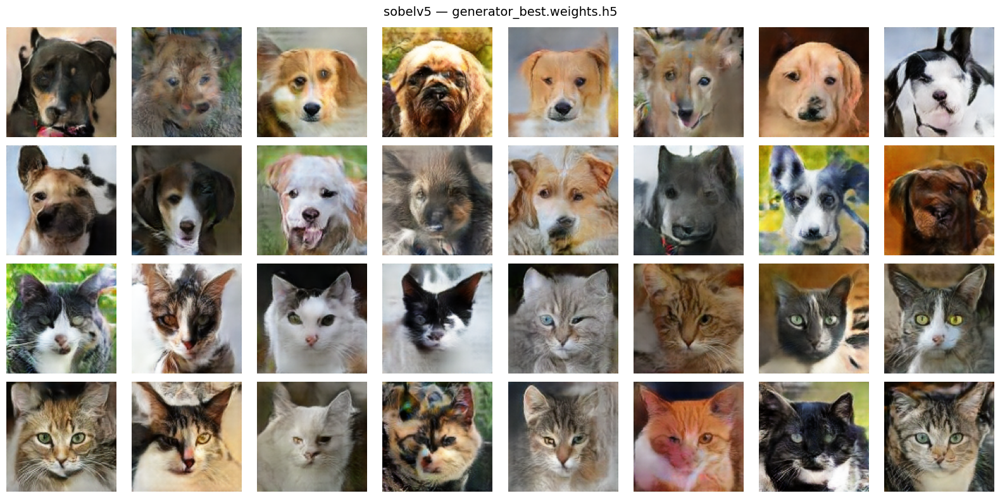

Saved: D:\Images by GAN\dog-gan-project\notebooks\evaluation\sobelv5\figures\04_selected_checkpoint_grid.png


In [12]:
rng = np.random.default_rng(RANDOM_SEED)

fixed_noise_np = rng.standard_normal(
    (GRID_SAMPLES_PER_CLASS * NUM_CLASSES, NOISE_DIM)
).astype("float32")

fixed_labels_np = np.concatenate([
    np.full(GRID_SAMPLES_PER_CLASS, SPECIES_TO_LABEL["dog"], dtype=np.int32),
    np.full(GRID_SAMPLES_PER_CLASS, SPECIES_TO_LABEL["cat"], dtype=np.int32),
])

fixed_images = generator(
    [tf.constant(fixed_noise_np), tf.constant(fixed_labels_np)],
    training=False,
)
fixed_images_uint8 = (
    ((fixed_images.numpy() + 1.0) * 127.5)
    .clip(0, 255)
    .astype("uint8")
)

fig, axes = plt.subplots(4, 8, figsize=(16, 8))
for i, ax in enumerate(axes.ravel()):
    ax.imshow(fixed_images_uint8[i])
    ax.axis("off")

fig.suptitle(f"sobelv5 — {SELECTED_CHECKPOINT.name}", fontsize=14)
plt.tight_layout()
grid_path = FIGURE_DIR / "04_selected_checkpoint_grid.png"
plt.savefig(grid_path, dpi=150, bbox_inches="tight")
plt.show()

print("Saved:", grid_path)

## 10. Generated-Image Metrics

### English
The basic metrics reproduce the monitoring logic used during training.

- `struct`: shape diversity after grayscale downsampling and per-image standardization.
- `color`: variation of mean RGB values across samples.
- `sharp`: mean Sobel gradient magnitude.

These metrics are diagnostic indicators. They do not determine whether facial anatomy is correct.

### Tiếng Việt
Các metric cơ bản giữ nguyên logic monitoring trong notebook training.

- `struct`: độ đa dạng cấu trúc sau khi grayscale, downsample và chuẩn hóa từng ảnh.
- `color`: độ phân tán màu RGB trung bình giữa các ảnh.
- `sharp`: độ lớn gradient Sobel trung bình.

Các metric này là tín hiệu chẩn đoán. Chúng không tự kết luận anatomy khuôn mặt có đúng hay không.

In [13]:
def structure_diversity(images, size=32):
    gray = tf.image.rgb_to_grayscale(images)
    gray = tf.image.resize(gray, [size, size], method="area")

    flat = tf.reshape(gray, [tf.shape(gray)[0], -1])
    flat = (flat - tf.reduce_mean(flat, axis=1, keepdims=True)) / (
        tf.math.reduce_std(flat, axis=1, keepdims=True) + 1e-6
    )

    n = tf.cast(tf.shape(flat)[0], tf.float32)
    d = tf.cast(tf.shape(flat)[1], tf.float32)

    gram = tf.matmul(flat, flat, transpose_b=True) / d
    off_diagonal = tf.reduce_sum(gram) - tf.linalg.trace(gram)

    return float(1.0 - off_diagonal / (n * (n - 1.0)))


def color_diversity(images):
    per_image = tf.reduce_mean(images, axis=[1, 2])
    return float(tf.reduce_mean(tf.math.reduce_std(per_image, axis=0)))


def sharpness(images):
    gray = tf.image.rgb_to_grayscale((images + 1.0) / 2.0)
    edges = tf.image.sobel_edges(gray)
    magnitude = tf.sqrt(tf.reduce_sum(tf.square(edges), axis=-1) + 1e-8)
    return float(tf.reduce_mean(magnitude))


def measure_images(images):
    return {
        "struct": structure_diversity(images),
        "color": color_diversity(images),
        "sharp": sharpness(images),
    }


EVAL_NOISE = tf.constant(
    np.random.default_rng(RANDOM_SEED + 1)
    .standard_normal((EVAL_SAMPLES_PER_CLASS, NOISE_DIM))
    .astype("float32")
)


def evaluate_generated_metrics(model):
    rows = []

    for species, label in SPECIES_TO_LABEL.items():
        labels = tf.fill([EVAL_SAMPLES_PER_CLASS], tf.cast(label, tf.int32))
        images = model([EVAL_NOISE, labels], training=False)

        row = {"species": species}
        row.update(measure_images(images))
        rows.append(row)

    return pd.DataFrame(rows)


generated_metrics = evaluate_generated_metrics(generator)
display(generated_metrics)
generated_metrics.to_csv(TABLE_DIR / "generated_metrics.csv", index=False)

,species,struct,color,sharp
0,dog,0.931410,0.214086,0.306018
1,cat,0.944701,0.218223,0.324437


## 11. Optional Real-Data Discovery

### English
The notebook tries to find the processed dataset locally. A compatible data folder contains:

- `train_manifest.csv`
- `val_manifest.csv`
- `images_128/`

If it cannot find these files, the real-reference and FID/KID sections are skipped without affecting checkpoint loading or image generation.

### Tiếng Việt
Notebook thử tìm processed dataset trên máy. Một thư mục dữ liệu hợp lệ gồm:

- `train_manifest.csv`
- `val_manifest.csv`
- `images_128/`

Nếu không tìm thấy, các phần real-reference và FID/KID sẽ được bỏ qua; việc load checkpoint và sinh ảnh vẫn hoạt động bình thường.

In [14]:
def looks_like_data_root(path):
    path = Path(path)
    return (
        (path / "train_manifest.csv").is_file()
        and (path / "val_manifest.csv").is_file()
        and (path / "images_128").is_dir()
    )


def discover_data_root():
    if DATA_ROOT_OVERRIDE is not None:
        path = Path(DATA_ROOT_OVERRIDE).expanduser().resolve()
        return path if looks_like_data_root(path) else None

    for base in candidate_project_roots(CWD):
        for relative in (
            Path("data") / "processed",
            Path("processed"),
            Path("model") / "data" / "processed",
        ):
            path = (base / relative).resolve()
            if looks_like_data_root(path):
                return path

    return None


DATA_ROOT = discover_data_root()
DATA_AVAILABLE = DATA_ROOT is not None

if DATA_AVAILABLE:
    TRAIN_MANIFEST_PATH = DATA_ROOT / "train_manifest.csv"
    VAL_MANIFEST_PATH = DATA_ROOT / "val_manifest.csv"
    REAL_IMAGES_DIR = DATA_ROOT / "images_128"

    train_manifest = pd.read_csv(TRAIN_MANIFEST_PATH)
    val_manifest = pd.read_csv(VAL_MANIFEST_PATH)

    print("Real dataset found:", DATA_ROOT)
    print("Train:", len(train_manifest))
    print("Val  :", len(val_manifest))
else:
    train_manifest = None
    val_manifest = None
    REAL_IMAGES_DIR = None

    print("Processed real dataset was not found.")
    print("Generated-only evaluation will continue.")
    print("Set DATA_ROOT_OVERRIDE if the data exists elsewhere.")

Real dataset found: D:\Images by GAN\dog-gan-project\data\processed
Train: 9950
Val  : 866


## 12. Real-Image Reference Metrics

### English
When validation data is available, generated metrics are compared with real validation images using the same `struct`, `color`, and `sharp` definitions.

### Tiếng Việt
Khi có validation data, các metric của ảnh sinh được so với ảnh thật bằng cùng định nghĩa `struct`, `color` và `sharp`.

In [15]:
def load_real_image(path):
    raw = tf.io.read_file(str(path))
    image = tf.io.decode_image(raw, channels=3, expand_animations=False)
    image.set_shape([None, None, 3])
    image = tf.image.resize(image, [IMAGE_SIZE, IMAGE_SIZE])
    image = tf.cast(image, tf.float32) / 127.5 - 1.0
    return image


def real_images_for_species(manifest, species, count, seed=RANDOM_SEED):
    subset = manifest[manifest["species"] == species].copy()

    if subset.empty:
        raise ValueError(f"No real {species} rows found in the manifest.")

    n = min(count, len(subset))
    subset = subset.sample(n=n, random_state=seed)

    images = []
    missing = []

    for filepath in subset["filepath"]:
        name = Path(str(filepath).replace("\\", "/")).name
        path = REAL_IMAGES_DIR / name

        if not path.is_file():
            missing.append(name)
            continue

        images.append(load_real_image(path))

    if missing:
        print(f"WARNING: {species}: {len(missing)} sampled files were missing.")

    if not images:
        raise FileNotFoundError(f"No readable real {species} images were found.")

    return tf.stack(images, axis=0)


if DATA_AVAILABLE:
    comparison_rows = []

    for species, label in SPECIES_TO_LABEL.items():
        real_images = real_images_for_species(
            val_manifest,
            species,
            EVAL_SAMPLES_PER_CLASS,
            seed=RANDOM_SEED,
        )

        labels = tf.fill([EVAL_SAMPLES_PER_CLASS], tf.cast(label, tf.int32))
        fake_images = generator([EVAL_NOISE, labels], training=False)

        real_metrics = measure_images(real_images)
        fake_metrics = measure_images(fake_images)

        row = {"species": species}
        for key in ("struct", "color", "sharp"):
            row[f"real_{key}"] = real_metrics[key]
            row[f"fake_{key}"] = fake_metrics[key]
            row[f"{key}_ratio"] = fake_metrics[key] / (real_metrics[key] + 1e-8)

        comparison_rows.append(row)

    real_comparison = pd.DataFrame(comparison_rows)
    display(real_comparison)
    real_comparison.to_csv(TABLE_DIR / "real_vs_generated_metrics.csv", index=False)
else:
    real_comparison = None
    print("Skipped: real validation data is not available.")

,species,real_struct,fake_struct,struct_ratio,real_color,fake_color,color_ratio,real_sharp,fake_sharp,sharp_ratio
0,dog,0.952680,0.931410,0.977674,0.235299,0.214086,0.909845,0.309894,0.306018,0.987493
1,cat,0.980763,0.944701,0.963231,0.203268,0.218223,1.073572,0.342958,0.324437,0.945996


## 13. Stage-Best Visual Comparison

### English
If best checkpoints from several stages are available, the same latent vectors are generated by each one. This makes the structural progression directly comparable.

### Tiếng Việt
Nếu có best checkpoint của nhiều stage, notebook dùng đúng cùng latent vector cho từng stage. Nhờ vậy có thể so trực tiếp quá trình thay đổi cấu trúc.

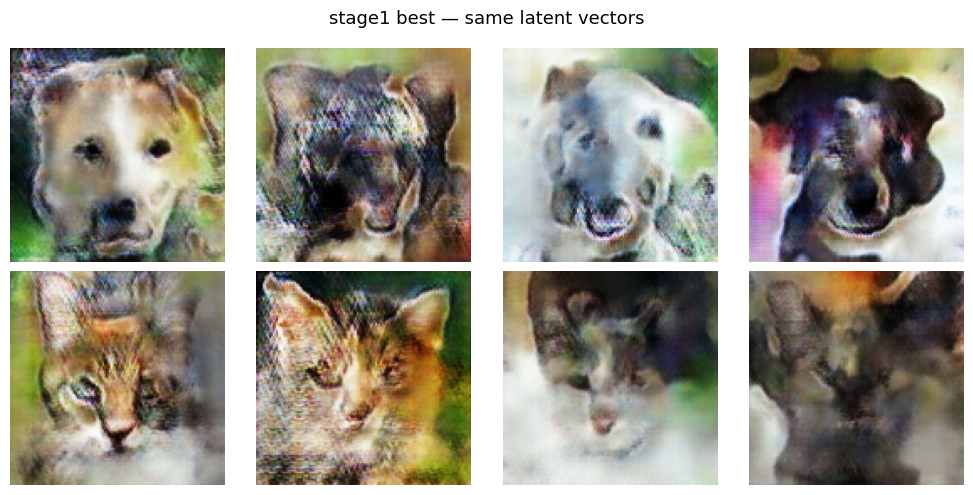

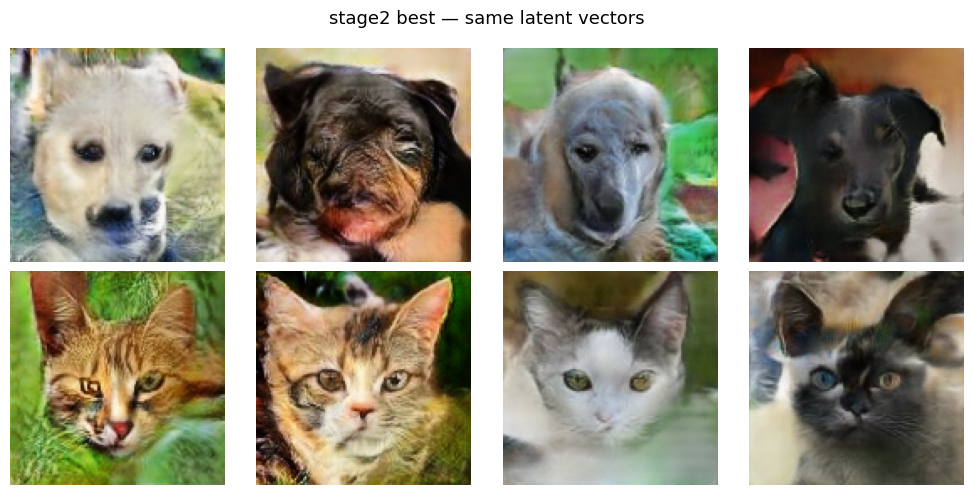

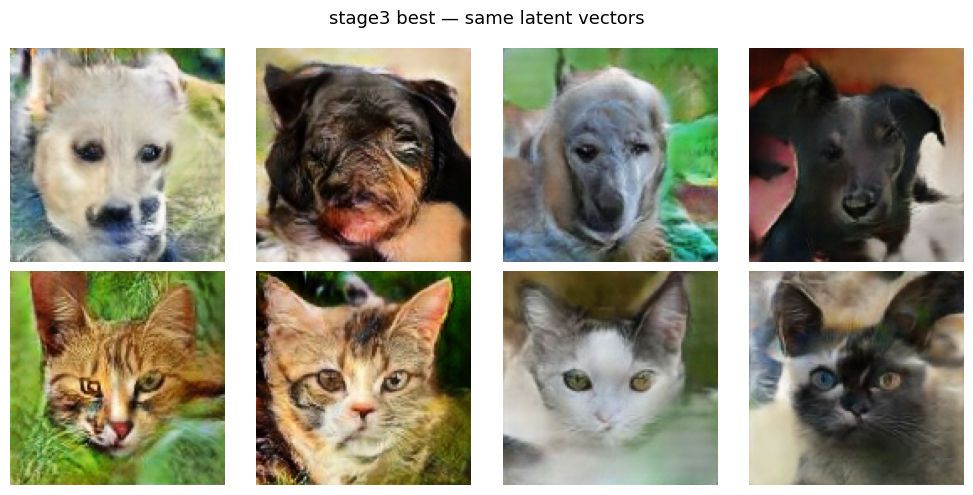

In [16]:
stage_best_paths = {}

for stage in ("stage1", "stage2", "stage3"):
    path = MODEL_ROOT / stage / "best" / "generator_best.weights.h5"
    if path.exists():
        stage_best_paths[stage] = path

if not stage_best_paths:
    print("No stage best checkpoints found.")
else:
    comparison_noise = tf.constant(
        np.random.default_rng(RANDOM_SEED + 100)
        .standard_normal((8, NOISE_DIM))
        .astype("float32")
    )
    comparison_labels = tf.constant([0, 0, 0, 0, 1, 1, 1, 1], dtype=tf.int32)

    for stage, path in stage_best_paths.items():
        model = build_generator(name=f"generator_{stage}_evaluation")
        model.load_weights(path)

        images = model([comparison_noise, comparison_labels], training=False)
        images = ((images.numpy() + 1.0) / 2.0).clip(0, 1)

        fig, axes = plt.subplots(2, 4, figsize=(10, 5))
        for i, ax in enumerate(axes.ravel()):
            ax.imshow(images[i])
            ax.axis("off")

        fig.suptitle(f"{stage} best — same latent vectors", fontsize=13)
        plt.tight_layout()

        path_out = FIGURE_DIR / f"stage_best_{stage}.png"
        plt.savefig(path_out, dpi=150, bbox_inches="tight")
        plt.show()

        del model

## 14. Optional Inception FID and KID

### English
This section is optional because it is heavier than the basic metrics.

When enabled, it:
1. loads ImageNet InceptionV3;
2. extracts pooled features from real and generated images;
3. computes FID;
4. estimates KID using polynomial-kernel subsets.

FID/KID are reported for dog, cat, and the combined set.

Set:

`RUN_INCEPTION_METRICS = True`

in the configuration cell to enable it.

### Tiếng Việt
Phần này là tùy chọn vì nặng hơn các metric cơ bản.

Khi bật, notebook:
1. load ImageNet InceptionV3;
2. lấy pooled feature từ ảnh thật và ảnh sinh;
3. tính FID;
4. ước lượng KID bằng polynomial-kernel subsets.

FID/KID được báo cáo riêng cho dog, cat và toàn bộ tập.

Đặt:

`RUN_INCEPTION_METRICS = True`

trong cell cấu hình để bật.

In [17]:
def preprocess_for_inception(images):
    images = (images + 1.0) * 127.5
    images = tf.image.resize(images, [299, 299], method="bilinear")
    return tf.keras.applications.inception_v3.preprocess_input(images)


def inception_features(feature_model, images, batch_size=32):
    ds = tf.data.Dataset.from_tensor_slices(images).batch(batch_size)
    features = []

    for batch in ds:
        batch = preprocess_for_inception(batch)
        features.append(feature_model(batch, training=False).numpy())

    return np.concatenate(features, axis=0)


def covariance_sqrt_product(cov1, cov2):
    from scipy import linalg

    covmean, _ = linalg.sqrtm(cov1 @ cov2, disp=False)

    if np.iscomplexobj(covmean):
        if not np.allclose(np.diag(covmean).imag, 0, atol=1e-3):
            warnings.warn("FID covariance product produced noticeable imaginary components.")
        covmean = covmean.real

    return covmean


def fid_from_features(real_features, fake_features):
    mu1 = np.mean(real_features, axis=0)
    mu2 = np.mean(fake_features, axis=0)

    cov1 = np.cov(real_features, rowvar=False)
    cov2 = np.cov(fake_features, rowvar=False)

    mean_term = np.sum((mu1 - mu2) ** 2)
    covmean = covariance_sqrt_product(cov1, cov2)

    fid = mean_term + np.trace(cov1 + cov2 - 2.0 * covmean)
    return float(np.real(fid))


def polynomial_kernel(x, y):
    dim = x.shape[1]
    return ((x @ y.T) / dim + 1.0) ** 3


def unbiased_mmd2(x, y):
    k_xx = polynomial_kernel(x, x)
    k_yy = polynomial_kernel(y, y)
    k_xy = polynomial_kernel(x, y)

    m = x.shape[0]
    n = y.shape[0]

    xx = (k_xx.sum() - np.trace(k_xx)) / (m * (m - 1))
    yy = (k_yy.sum() - np.trace(k_yy)) / (n * (n - 1))
    xy = k_xy.mean()

    return float(xx + yy - 2.0 * xy)


def kid_from_features(
    real_features,
    fake_features,
    subset_size=100,
    subsets=50,
    seed=RANDOM_SEED,
):
    rng = np.random.default_rng(seed)

    subset_size = min(
        subset_size,
        len(real_features),
        len(fake_features),
    )

    if subset_size < 2:
        raise ValueError("KID requires at least two real and two fake feature vectors.")

    values = []

    for _ in range(subsets):
        real_idx = rng.choice(len(real_features), subset_size, replace=False)
        fake_idx = rng.choice(len(fake_features), subset_size, replace=False)

        values.append(
            unbiased_mmd2(
                real_features[real_idx],
                fake_features[fake_idx],
            )
        )

    return float(np.mean(values)), float(np.std(values))


def generate_for_species(model, label, count, batch_size=GENERATION_BATCH_SIZE, seed=RANDOM_SEED):
    rng = np.random.default_rng(seed)
    outputs = []

    produced = 0
    while produced < count:
        current = min(batch_size, count - produced)

        noise = rng.standard_normal((current, NOISE_DIM)).astype("float32")
        labels = np.full(current, label, dtype=np.int32)

        images = model(
            [tf.constant(noise), tf.constant(labels)],
            training=False,
        )
        outputs.append(images)

        produced += current

    return tf.concat(outputs, axis=0)


if RUN_INCEPTION_METRICS and DATA_AVAILABLE:
    print("Loading InceptionV3 ImageNet feature extractor...")
    inception = tf.keras.applications.InceptionV3(
        include_top=False,
        weights="imagenet",
        pooling="avg",
        input_shape=(299, 299, 3),
    )

    inception_rows = []
    combined_real_features = []
    combined_fake_features = []

    for species, label in SPECIES_TO_LABEL.items():
        available_real = len(val_manifest[val_manifest["species"] == species])
        n = min(FID_SAMPLES_PER_CLASS, available_real)

        if n < 2:
            print(f"Skipping {species}: insufficient real validation images.")
            continue

        print(f"{species}: evaluating {n} real + {n} generated images...")

        real_images = real_images_for_species(
            val_manifest,
            species,
            n,
            seed=RANDOM_SEED + 200 + label,
        )
        fake_images = generate_for_species(
            generator,
            label,
            n,
            seed=RANDOM_SEED + 300 + label,
        )

        real_features = inception_features(inception, real_images)
        fake_features = inception_features(inception, fake_images)

        fid = fid_from_features(real_features, fake_features)
        kid_mean, kid_std = kid_from_features(
            real_features,
            fake_features,
            subset_size=KID_SUBSET_SIZE,
            subsets=KID_SUBSETS,
            seed=RANDOM_SEED + label,
        )

        inception_rows.append({
            "scope": species,
            "n_real": len(real_features),
            "n_fake": len(fake_features),
            "fid": fid,
            "kid_mean": kid_mean,
            "kid_std": kid_std,
        })

        combined_real_features.append(real_features)
        combined_fake_features.append(fake_features)

    if combined_real_features:
        real_all = np.concatenate(combined_real_features, axis=0)
        fake_all = np.concatenate(combined_fake_features, axis=0)

        fid_all = fid_from_features(real_all, fake_all)
        kid_mean_all, kid_std_all = kid_from_features(
            real_all,
            fake_all,
            subset_size=KID_SUBSET_SIZE,
            subsets=KID_SUBSETS,
            seed=RANDOM_SEED + 999,
        )

        inception_rows.append({
            "scope": "combined",
            "n_real": len(real_all),
            "n_fake": len(fake_all),
            "fid": fid_all,
            "kid_mean": kid_mean_all,
            "kid_std": kid_std_all,
        })

    inception_metrics = pd.DataFrame(inception_rows)
    display(inception_metrics)
    inception_metrics.to_csv(TABLE_DIR / "inception_fid_kid.csv", index=False)
elif RUN_INCEPTION_METRICS and not DATA_AVAILABLE:
    inception_metrics = None
    print("FID/KID skipped because real validation data is not available.")
else:
    inception_metrics = None
    print("FID/KID disabled. Set RUN_INCEPTION_METRICS = True to run it.")

FID/KID disabled. Set RUN_INCEPTION_METRICS = True to run it.


## 15. Random Seed Contact Sheet

### English
This section generates a larger random contact sheet for manual quality inspection. Every image is annotated with a reproducible latent ID.

The latent vectors are saved to `.npz`, so a visually good or bad sample can be reproduced exactly later.

### Tiếng Việt
Phần này sinh một contact sheet lớn để kiểm tra chất lượng bằng mắt. Mỗi ảnh có một latent ID để nhận diện.

Các latent vector được lưu vào `.npz`, vì vậy một mẫu đẹp hoặc xấu có thể được tái tạo chính xác về sau.

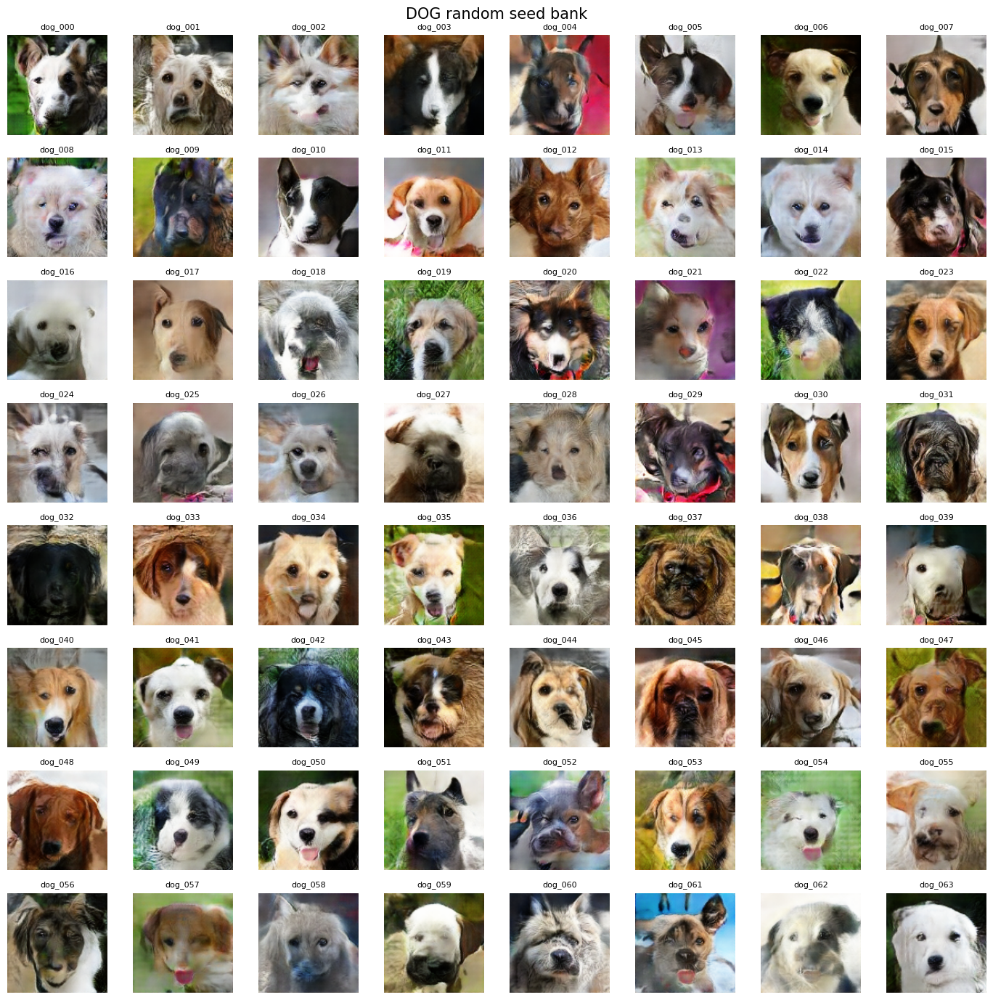

Saved: D:\Images by GAN\dog-gan-project\notebooks\evaluation\sobelv5\figures\seed_bank_dog.png


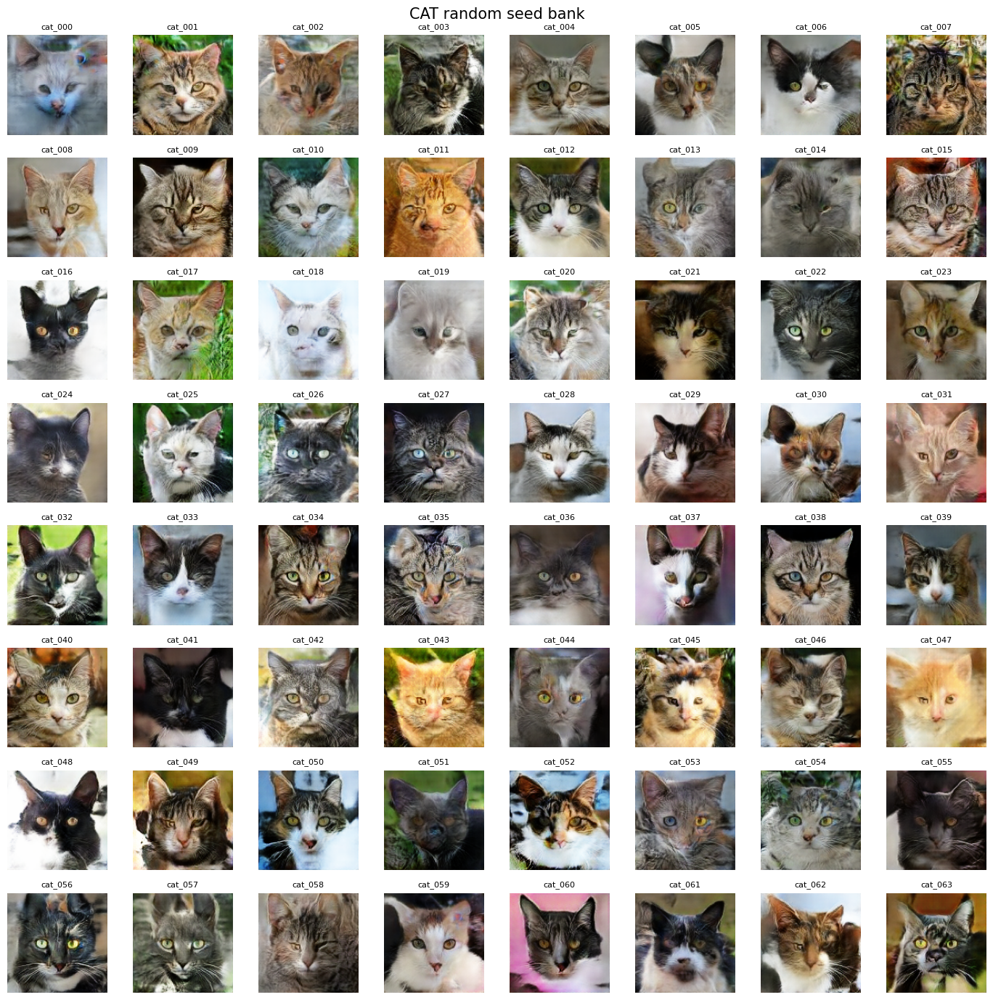

Saved: D:\Images by GAN\dog-gan-project\notebooks\evaluation\sobelv5\figures\seed_bank_cat.png


In [18]:
SEED_BANK_PER_CLASS = 64

seed_rng = np.random.default_rng(RANDOM_SEED + 500)

seed_bank_noise = {}
seed_bank_images = {}

for species, label in SPECIES_TO_LABEL.items():
    noise = seed_rng.standard_normal(
        (SEED_BANK_PER_CLASS, NOISE_DIM)
    ).astype("float32")

    labels = np.full(SEED_BANK_PER_CLASS, label, dtype=np.int32)

    images = generator(
        [tf.constant(noise), tf.constant(labels)],
        training=False,
    )

    seed_bank_noise[species] = noise
    seed_bank_images[species] = (
        ((images.numpy() + 1.0) * 127.5)
        .clip(0, 255)
        .astype("uint8")
    )

np.savez_compressed(
    OUTPUT_DIR / "seed_bank_latents.npz",
    dog=seed_bank_noise["dog"],
    cat=seed_bank_noise["cat"],
)

for species in ("dog", "cat"):
    images = seed_bank_images[species]

    fig, axes = plt.subplots(8, 8, figsize=(14, 14))
    for i, ax in enumerate(axes.ravel()):
        ax.imshow(images[i])
        ax.set_title(f"{species}_{i:03d}", fontsize=8)
        ax.axis("off")

    fig.suptitle(f"{species.upper()} random seed bank", fontsize=15)
    plt.tight_layout()

    out_path = FIGURE_DIR / f"seed_bank_{species}.png"
    plt.savefig(out_path, dpi=150, bbox_inches="tight")
    plt.show()

    print("Saved:", out_path)

## 16. Export Evaluation Summary

### English
The final cell writes a compact JSON report with the evaluated checkpoint, architecture, generated-image metrics, available best-checkpoint metadata, and optional real/FID/KID results.

### Tiếng Việt
Cell cuối lưu một file JSON tóm tắt checkpoint đã đánh giá, kiến trúc, metric ảnh sinh, metadata best checkpoint và kết quả real/FID/KID nếu có.

In [19]:
summary = {
    "model": "sobelv5",
    "checkpoint": str(SELECTED_CHECKPOINT),
    "image_size": IMAGE_SIZE,
    "noise_dim": NOISE_DIM,
    "embedding_dim": EMBEDDING_DIM,
    "species_to_label": SPECIES_TO_LABEL,
    "generated_metrics": generated_metrics.to_dict(orient="records"),
    "real_data_available": bool(DATA_AVAILABLE),
}

if best_table is not None:
    summary["best_checkpoints"] = best_table.to_dict(orient="records")

if real_comparison is not None:
    summary["real_vs_generated"] = real_comparison.to_dict(orient="records")

if inception_metrics is not None:
    summary["inception_metrics"] = inception_metrics.to_dict(orient="records")

summary_path = OUTPUT_DIR / "evaluation_summary.json"
summary_path.write_text(
    json.dumps(summary, indent=2, ensure_ascii=False),
    encoding="utf-8",
)

print("Evaluation complete.")
print("Summary :", summary_path)
print("Figures :", FIGURE_DIR)
print("Tables  :", TABLE_DIR)
print("Latents :", OUTPUT_DIR / "seed_bank_latents.npz")

Evaluation complete.
Summary : D:\Images by GAN\dog-gan-project\notebooks\evaluation\sobelv5\evaluation_summary.json
Figures : D:\Images by GAN\dog-gan-project\notebooks\evaluation\sobelv5\figures
Tables  : D:\Images by GAN\dog-gan-project\notebooks\evaluation\sobelv5\tables
Latents : D:\Images by GAN\dog-gan-project\notebooks\evaluation\sobelv5\seed_bank_latents.npz


## Summary

### English
This report evaluates `sobelv5` without retraining it.

Core outputs:
- checkpoint inventory;
- training-history summary;
- best-checkpoint metadata;
- fixed-seed sample grid;
- generated `struct`, `color`, and `sharp` metrics;
- optional real-image comparison;
- optional Inception FID/KID;
- stage-best visual comparison;
- reproducible random seed contact sheets.

### Tiếng Việt
Notebook này đánh giá `sobelv5` mà không train lại model.

Output chính:
- danh sách checkpoint;
- tóm tắt training history;
- metadata best checkpoint;
- fixed-seed sample grid;
- metric `struct`, `color`, `sharp` của ảnh sinh;
- so sánh với ảnh thật nếu có data;
- Inception FID/KID tùy chọn;
- so sánh trực quan best checkpoint giữa các stage;
- contact sheet các seed ngẫu nhiên có thể tái tạo.